In [ ]:
!pip install -r requirements.txt

### Import Libraries

In [2]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import ipyplot
import gc
from transformers import pipeline


access_token = "YOUR HUGGING FACE TOKEN"


        WARNING! Google Colab Environment detected!
        You might encounter issues while running in Google Colab environment.
        If images are not displaying properly please try setting `force_b64` param to `True`.
        


### Helper Functions

In [3]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30 / 255, 144 / 255, 255 / 255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    del mask
    gc.collect()

def show_masks_on_image(raw_image, masks):
    plt.imshow(np.array(raw_image))
    ax = plt.gca()
    ax.set_autoscale_on(False)
    for mask in masks:
        show_mask(mask, ax=ax, random_color=True)
    plt.axis("off")
    plt.show()
    del mask
    gc.collect()

def add_background(bg_path, original_image, sam_mask) -> None:

    # load background
    background = np.array(Image.open(bg_path).resize((512,512)))

    # reverse mask and add the third dimension for easier numpy manipulation
    reverse_mask = np.where(sam_mask==0, 1, 0)
    reverse_mask = reverse_mask.reshape((reverse_mask.shape[0], reverse_mask.shape[1], 1))

    # create a hole in the background equal to the object
    background = background*reverse_mask

    # convert original image to numpy and add third dimension to mask
    np_image = np.array(original_image)
    mask = sam_mask.reshape((sam_mask.shape[0],sam_mask.shape[1], 1))

    # add speaker to background
    img = background+(mask*np_image)

    # plot all images
    ipyplot.plot_images([original_image, Image.fromarray(background.astype('uint8')), Image.fromarray(img.astype('uint8'))], labels=["original", "background", "final"], img_width=512)

def display_image_with_masks(image, masks):
    num_masks = len(masks)

    fig, axes = plt.subplots(1, num_masks + 1, figsize=(15, 5))
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    for i, mask_np in enumerate(masks):
        axes[i+1].imshow(mask_np, cmap='gray')
        axes[i+1].set_title(f"Mask {i+1}")
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

### Load image to segment

/usr/local/lib/python3.10/dist-packages/ipyplot/_utils.py:95: FutureWarning: The input object of type 'Image' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Image', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  return np.asarray(seq, dtype=type(seq[0]))



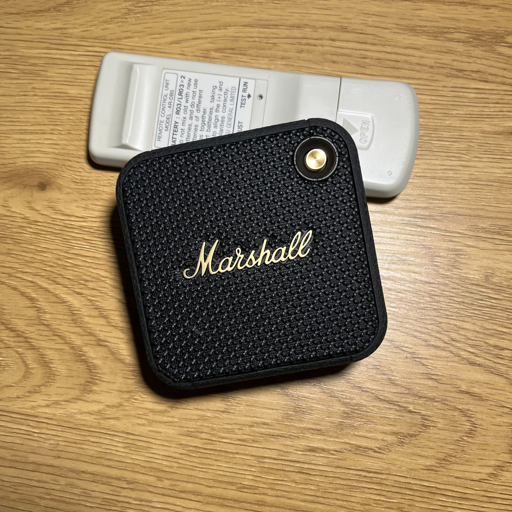


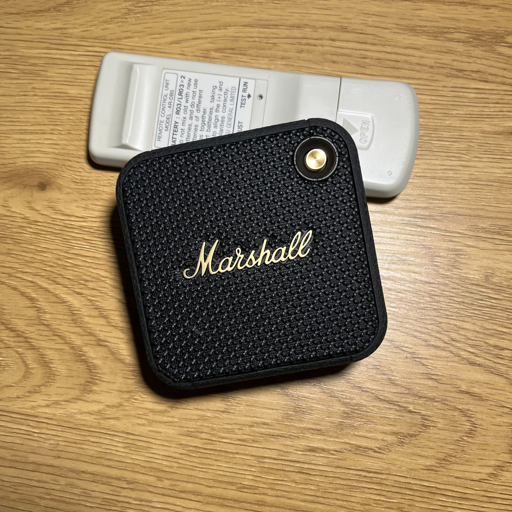

In [4]:
raw_image = Image.open("images/IMG_0126.jpg").resize((512,512)) # model was trained with squared images
ipyplot.plot_images([raw_image], labels=["original"], img_width=512)

### Load model and generate masks

config.json:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.56G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

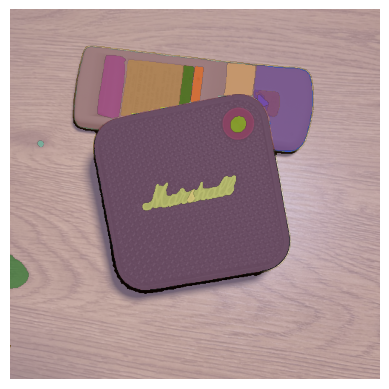

In [5]:
# load model
generator = pipeline("mask-generation", model="facebook/sam-vit-huge", device=0, token=access_token)

# generate masks
outputs = generator(raw_image, points_per_batch=64)

# plot masks on original image
masks = outputs["masks"]
show_masks_on_image(raw_image, masks)

### Select mask of interest

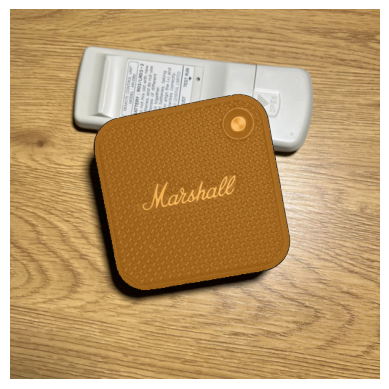

In [6]:
# in our case we want the mask that covers the marshall speaker
mask = masks[2]
show_masks_on_image(raw_image, [mask])

# save mask where the speaker is black and the rest is white, which means speaker pixels is 0 and the rest is 255
Image.fromarray(((mask!=True)*255).astype('uint8')).save('images/mask.png')

### Generate different backgrounds for the marshall speaker

/usr/local/lib/python3.10/dist-packages/ipyplot/_utils.py:95: FutureWarning: The input object of type 'Image' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Image', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  return np.asarray(seq, dtype=type(seq[0]))



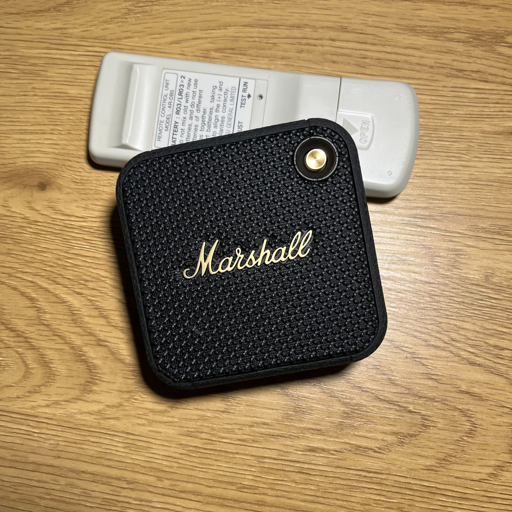
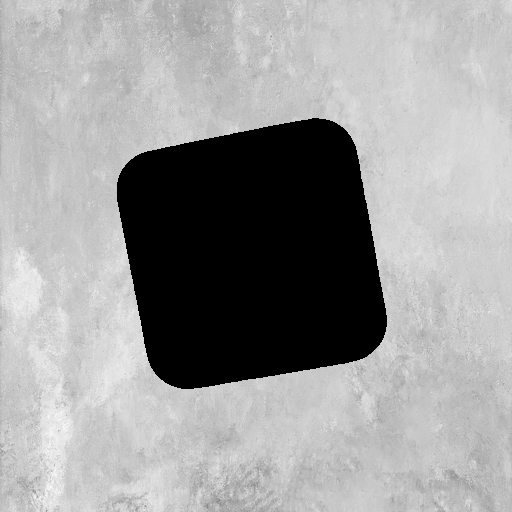
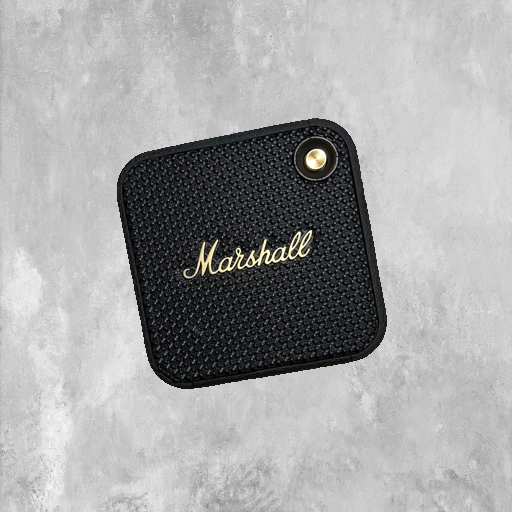


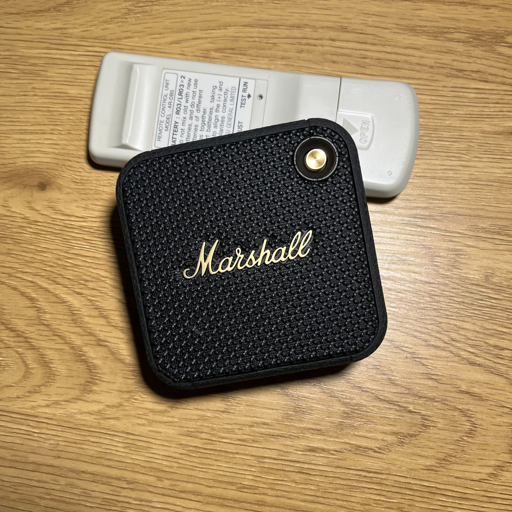
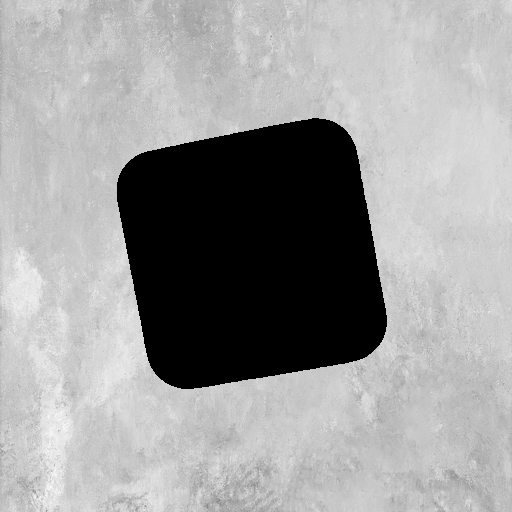
...
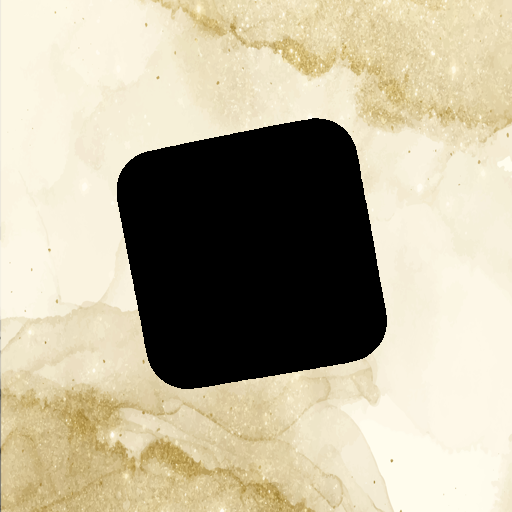
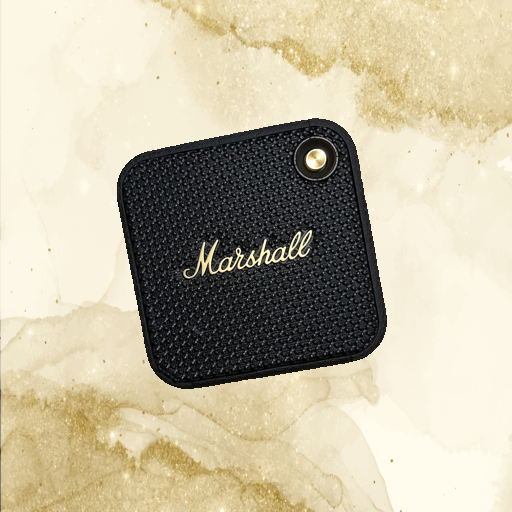


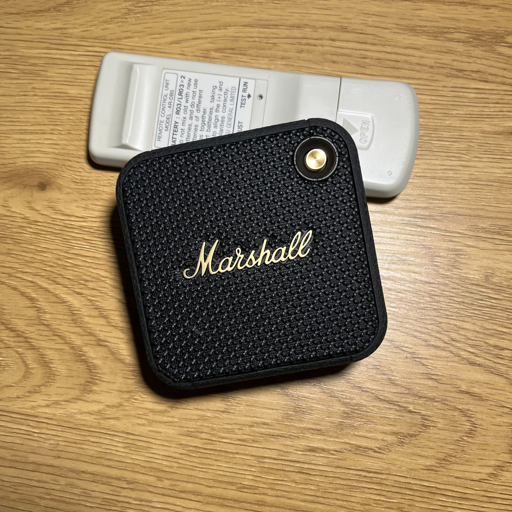
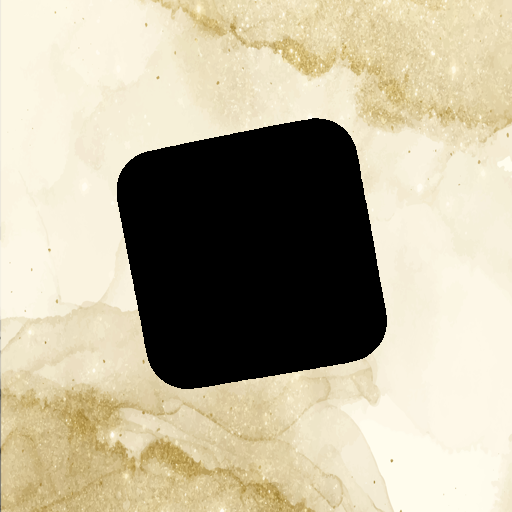
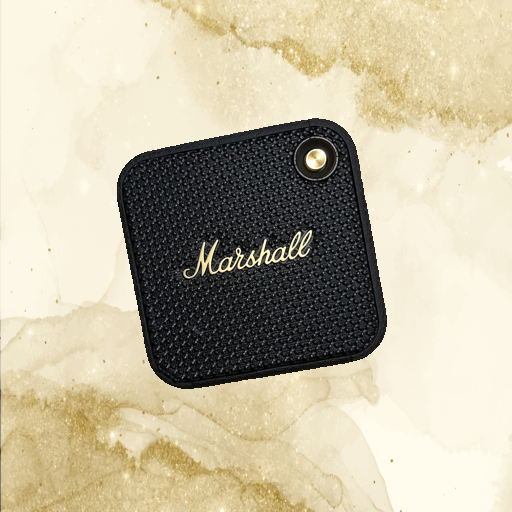

In [7]:
for i in range(1,5):
  add_background(f"images/back{i}.jpg", raw_image, mask)

# Creating the mask guided by a text prompt

In [ ]:
!pip install -U git+https://github.com/luca-medeiros/lang-segment-anything.git

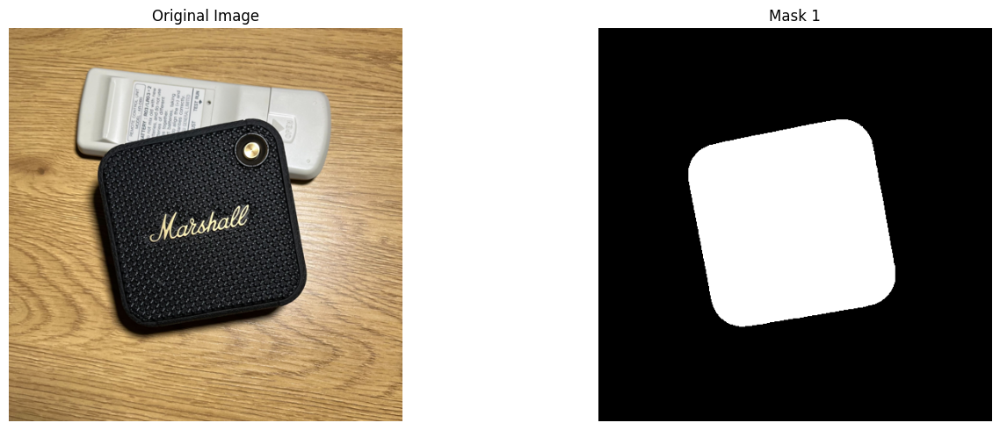

In [ ]:
from lang_sam import LangSAM

model = LangSAM()
image_pil = Image.open("images/IMG_0126.jpg").resize((512,512)).convert("RGB")
text_prompt = "speaker"
masks, boxes, phrases, logits = model.predict(image_pil, text_prompt)

# Convert masks to numpy arrays
masks_np = [mask.squeeze().cpu().numpy() for mask in masks]

# Display the original image and masks side by side
display_image_with_masks(image_pil, masks_np)